#EDA part

In [1]:
#import library and configures 
import pandas as pd
import numpy as np
import os
import requests
from matplotlib import pyplot as plt
from matplotlib import ticker
import matplotlib.colors as mc
import seaborn as sns
from IPython.display import HTML
import re
from collections import Counter
import wordcloud
from pprint import pprint
import random
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.util import ngrams
from nltk import download as nltk_download
from PIL import Image
import tempfile
import io
from PIL import Image
import time
from scipy.spatial import distance
from skimage import color as skcolor

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn import linear_model, svm, datasets, metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score


In [3]:
# !pip install wordcloud
df = pd.read_csv('archive/US_youtube_trending_data.csv')
df_nt = pd.read_csv('ULTIMATEFINALData.csv')

In [143]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [144]:
#read the data
df1 = pd.read_csv('/content/drive/MyDrive/US_youtube_trending_data 2.csv')

In [5]:
df = df.head(30000)

In [6]:
df.shape

(30000, 16)

In [147]:
df_nt=pd.read_csv('/content/drive/MyDrive/ULTIMATEFINALData.csv')

In [7]:
df_nt.shape

(60355, 16)

In [8]:
df['trending or not'] = 1

In [9]:
df_nt['trending or not']=0

In [10]:
df_nt.head(1).transpose()

,0
video_id,zUt7jdOg0GI
title,6LB 162 - Faudrait
publishedAt,2020-07-03T18:00:11Z
channelId,UCnzz-NoUMm10rm2xaFywAXA
channelTitle,162 CLUB
categoryId,22
trending_date,NaN
tags,NaN
view_count,1933.0
likes,71.0


In [11]:
df.head(1).transpose()

,0
video_id,3C66w5Z0ixs
title,I ASKED HER TO BE MY GIRLFRIEND...
publishedAt,2020-08-11T19:20:14Z
channelId,UCvtRTOMP2TqYqu51xNrqAzg
channelTitle,Brawadis
categoryId,22
trending_date,2020-08-12T00:00:00Z
tags,brawadis|prank|basketball|skits|ghost|funny vi...
view_count,1514614
likes,156908


In [12]:
com=pd.concat([df,df_nt], axis=0, ignore_index=True)

In [13]:
com.head(1).transpose


<bound method DataFrame.transpose of       video_id                               title           publishedAt  \
0  3C66w5Z0ixs  I ASKED HER TO BE MY GIRLFRIEND...  2020-08-11T19:20:14Z   

                  channelId channelTitle  categoryId         trending_date  \
0  UCvtRTOMP2TqYqu51xNrqAzg     Brawadis          22  2020-08-12T00:00:00Z   

                                                tags  view_count     likes  \
0  brawadis|prank|basketball|skits|ghost|funny vi...   1514614.0  156908.0   

   dislikes  comment_count                                  thumbnail_link  \
0    5855.0        35313.0  https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg   

   comments_disabled  ratings_disabled  \
0                0.0               0.0   

                                         description  trending or not  
0  SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...                1  >

In [14]:
df.shape[0]

30000

In [15]:
df['view_count'].min()

0

In [16]:
# number of records with 0 view count (or actually no view count)
df[df['view_count'] == 0].shape[0]

10

In [17]:
# number of unique videos with 0 view count
df[df['view_count'] == 0]['video_id'].unique().shape[0]

3

In [18]:
# minimum view count except 0
df[df['view_count'] != 0]['view_count'].min()

38510

In [19]:
# trending video with max view count
df[df['view_count'] == df['view_count'].max()].transpose()

,3358
video_id,gdZLi9oWNZg
title,BTS (방탄소년단) 'Dynamite' Official MV
publishedAt,2020-08-21T03:58:10Z
channelId,UC3IZKseVpdzPSBaWxBxundA
channelTitle,Big Hit Labels
categoryId,10
trending_date,2020-08-28T00:00:00Z
tags,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄
view_count,232649205
likes,15735533


In [20]:
def plot_conf(ax, xlbl='', ylbl='', t='', back_color='#ffffff',
              text_color='#616161', grid_color='#e9e9e9', 
              tick_color='', ticklbl_size=9, lbl_size=11, lang='en'):
    """
    This function perform operations to produce better-looking 
    visualizations
    """
    # changing the background color of the plot
    ax.set_facecolor(back_color)
    # modifying the ticks on plot axes
    ax.tick_params(axis='both', labelcolor=text_color, color=back_color)
    if tick_color != '':
        ax.tick_params(axis='both', color=tick_color)
    ax.tick_params(axis='both', which='major', labelsize=ticklbl_size)
    # adding a grid and specifying its color
    ax.grid(True, color=grid_color)
    # making the grid appear behind the graph elements
    ax.set_axisbelow(True)
    # hiding axes
    ax.spines['bottom'].set_color(back_color)
    ax.spines['top'].set_color(back_color) 
    ax.spines['right'].set_color(back_color)
    ax.spines['left'].set_color(back_color)
    # setting the title, x label, and y label of the plot
    if lang == 'ar':
        ax.set_title(get_display(reshaper.reshape(t)), fontweight='bold', family='Amiri',
                     fontsize=14, color=text_color, loc='right', pad=24);
        ax.set_xlabel(get_display(reshaper.reshape(xlbl)), fontweight='bold', family='Amiri',
                      labelpad=16, fontsize=lbl_size, color=text_color, fontstyle='italic');
        ax.set_ylabel(get_display(reshaper.reshape(ylbl)), fontweight='bold', family='Amiri',
                      color=text_color, labelpad=16, fontsize=lbl_size, fontstyle='italic');
    else:
        ax.set_title(t, fontsize=14, color='#616161', loc='left', pad=24, fontweight='bold');
        ax.set_xlabel(xlbl, labelpad=16, fontsize=lbl_size, color='#616161', fontstyle='italic');
        ax.set_ylabel(ylbl, color='#616161', labelpad=16, fontsize=lbl_size, fontstyle='italic');
        
        

VIEW COUNT DISTRIBUTION

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


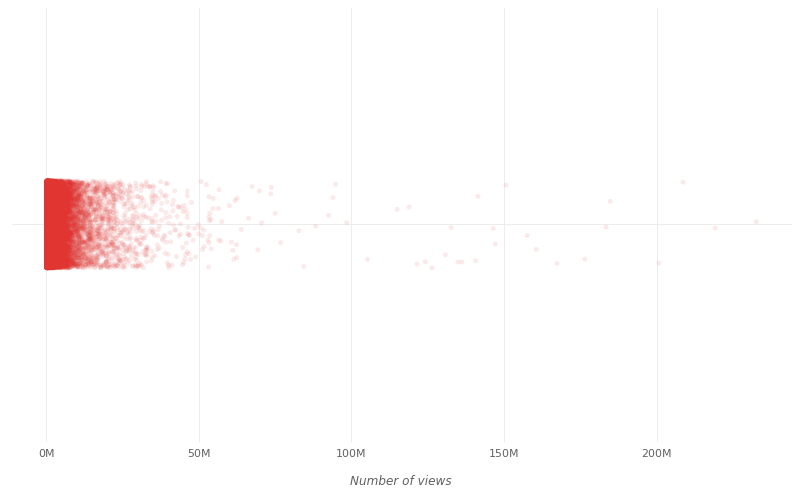

In [21]:
fig, ax = plt.subplots(figsize=(14,8))
THEME_COL = '#e03531'
sns.stripplot(df['view_count'], alpha=0.1, color=THEME_COL, ax=ax);
plot_conf(ax, xlbl='Number of views', ticklbl_size=11, lbl_size=12)
formatter = ticker.FuncFormatter(func=lambda x,y: '{:.0f}M'.format(x/1e6))
ax.xaxis.set_major_formatter(formatter)

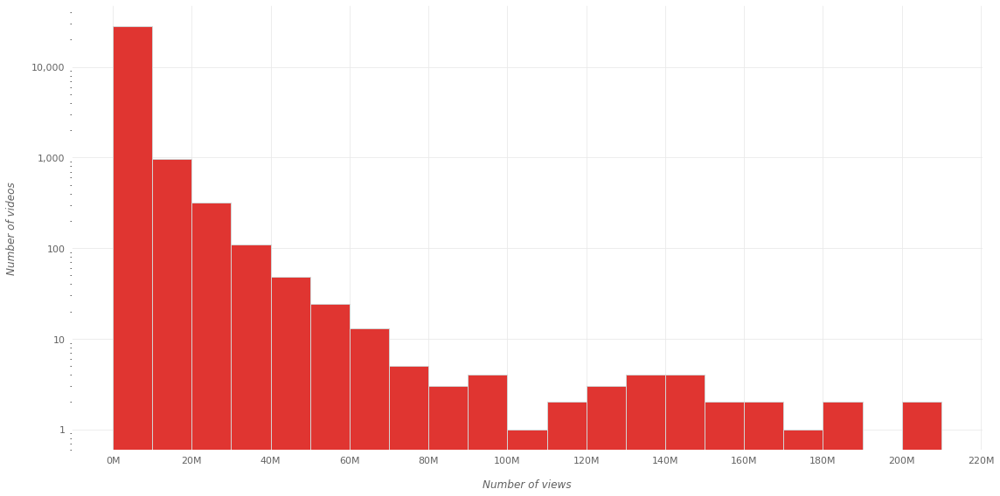

In [22]:
ax = df['view_count'].plot(kind='hist', bins=np.arange(0, 220e6, 10e6)-0.5, figsize=(16,8), 
                           logy=True, lw=1, ec='lightgray', color=THEME_COL);
plot_conf(ax, xlbl='Number of views', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
formatter = ticker.FuncFormatter(func=lambda x,y: '{:.0f}M'.format(x/1e6))
ax.xaxis.set_major_locator(ticker.MultipleLocator(20000000))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(formatter));
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}'))
plt.tight_layout()
plt.savefig('yta2-view-dist.png', dpi=300)

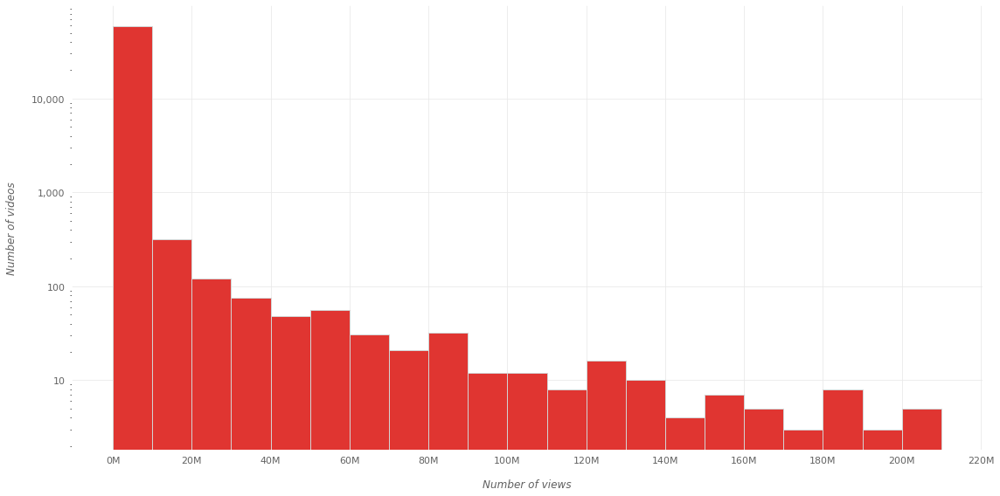

In [23]:
ax = df_nt['view_count'].plot(kind='hist', bins=np.arange(0, 220e6, 10e6)-0.5, figsize=(16,8), 
                           logy=True, lw=1, ec='lightgray', color=THEME_COL);
plot_conf(ax, xlbl='Number of views', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
formatter = ticker.FuncFormatter(func=lambda x,y: '{:.0f}M'.format(x/1e6))
ax.xaxis.set_major_locator(ticker.MultipleLocator(20000000))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(formatter));
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}'))
plt.tight_layout()
plt.savefig('nt-view-dist.png', dpi=300)

In [24]:
df_nt[df_nt['view_count'] < 10_000_000].shape[0] / df.shape[0] * 100

198.21666666666667

In [25]:
df[df['view_count'] < 10_000_000].shape[0] / df.shape[0] * 100

94.94666666666667

In [26]:
df[df['view_count'] < 100_000_000].shape[0] / df.shape[0] * 100

99.91666666666667

Trending videos with most views

In [27]:
df.sort_values(by='view_count', ascending=False).drop_duplicates(subset=['video_id']).head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,trending or not
3358,gdZLi9oWNZg,BTS (방탄소년단) 'Dynamite' Official MV,2020-08-21T03:58:10Z,UC3IZKseVpdzPSBaWxBxundA,Big Hit Labels,10,2020-08-28T00:00:00Z,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,232649205,15735533,714194,6065230,https://i.ytimg.com/vi/gdZLi9oWNZg/default.jpg,False,False,BTS (방탄소년단) 'Dynamite' Official MVCredits:Dire...,1
4980,vRXZj0DzXIA,BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V,2020-08-28T04:00:11Z,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,10,2020-09-05T00:00:00Z,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,184778248,11795670,879354,2735997,https://i.ytimg.com/vi/vRXZj0DzXIA/default.jpg,False,False,BLACKPINK - ‘Ice Cream (with Selena Gomez)’Com...,1
21367,-5q5mZbe3V8,BTS (방탄소년단) 'Life Goes On' Official MV,2020-11-20T04:58:11Z,UC3IZKseVpdzPSBaWxBxundA,Big Hit Labels,10,2020-11-28T00:00:00Z,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,150622781,11405030,126202,4160903,https://i.ytimg.com/vi/-5q5mZbe3V8/default.jpg,False,False,BTS (방탄소년단) 'Life Goes On' Official MVCredits:...,1
11764,dyRsYk0LyA8,BLACKPINK – ‘Lovesick Girls’ M/V,2020-10-02T04:00:13Z,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,10,2020-10-09T00:00:00Z,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,140685439,9217876,127308,1507605,https://i.ytimg.com/vi/dyRsYk0LyA8/default.jpg,False,False,BLACKPINK – ‘Lovesick Girls’영원한 밤창문 없는 방에 우릴 가...,1
985,hsm4poTWjMs,Cardi B - WAP feat. Megan Thee Stallion [Offic...,2020-08-07T04:00:10Z,UCxMAbVFmxKUVGAll0WVGpFw,Cardi B,10,2020-08-16T00:00:00Z,Cardi B|Cardi|Atlantic Records|rap|hip hop|tra...,98442414,3207729,467717,310630,https://i.ytimg.com/vi/hsm4poTWjMs/default.jpg,False,False,Cardi B - WAP feat. Megan Thee StallionStream/...,1


Trending videos with least views

In [28]:
(df[df['view_count'] > 0].sort_values(by='view_count', ascending=True).drop_duplicates(subset=['video_id']).head(3))

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,trending or not
12869,ff1GJHq5W2o,iPhone 12 and iPhone 12 Pro! Can ANYTHING Els...,2020-10-13T19:54:23Z,UCqvULRRboZeXVezSm_XduLQ,The Everyday Dad,28,2020-10-15T00:00:00Z,the everyday dad|iPhone 12 event|iPhone 12 pro...,38510,1249,99,326,https://i.ytimg.com/vi/ff1GJHq5W2o/default.jpg,False,False,The Apple Event for the iPhone 12 and the 12 P...,1
1095,vOpySfXMe6w,"Opry Livestream - Luke Bryan, Darius Rucker, &...",2020-08-16T01:14:47Z,UCTP55ODgXQzmV7ICXS0H72A,Circle All Access,10,2020-08-17T00:00:00Z,Luke Bryan|Darius Rucker|Bobby Bones|Opry|Circ...,44693,727,8,28,https://i.ytimg.com/vi/vOpySfXMe6w/default.jpg,False,False,Come together for a night of fun and music wit...,1
1152,tjXM6u36O98,MMA Pros React to Chito Vera TKO Sean O'Malley...,2020-08-16T04:22:26Z,UCz1Mrrnl2IYsb8VRoSW9gEQ,MMA Crazy,17,2020-08-17T00:00:00Z,Cody Garbrandt|Henry Cejudo|Stephen Wonderboy ...,47709,393,47,618,https://i.ytimg.com/vi/tjXM6u36O98/default.jpg,False,False,MMA Pros React to Marlon Chito Vera TKO Sean O...,1


How many views a video has when first appearing on the trending list?

In [29]:
cdf = df.drop_duplicates(subset=['video_id'])

In [30]:
cdf1 = df_nt.drop_duplicates(subset=['video_id'])

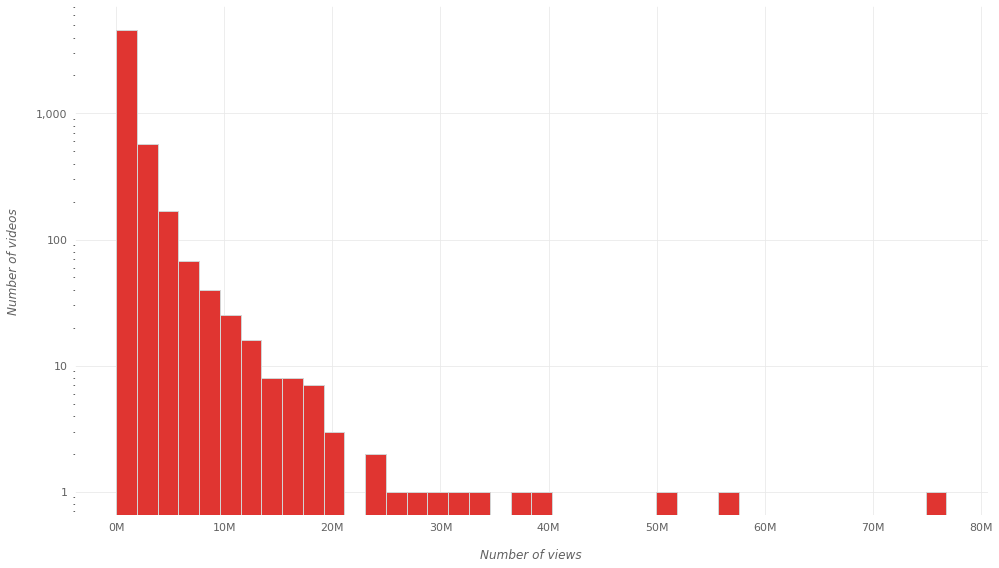

In [31]:
ax = cdf['view_count'].plot(kind='hist', figsize=(14,8), bins=40, logy=True, color=THEME_COL,
                            lw=1, ec='lightgray')
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'));
def millions(x, pos):
    return '{}M'.format(int(x / 1000000))
ax.xaxis.set_major_locator(ticker.MultipleLocator(10000000))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(millions));

plot_conf(ax, xlbl='Number of views', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
plt.tight_layout()
plt.savefig('yta2-trendfrv.png', dpi=300)

In [32]:
'{:,.0f}'.format(cdf['view_count'].quantile(q=0.9))

'2,872,418'

In [33]:
'{:,.0f}'.format(cdf1['view_count'].quantile(q=0.9))

'259,148'

In [34]:
'{:,.0f}'.format(cdf['view_count'].quantile(q=0.95))

'4,510,921'

In [35]:
# min views
'{:,.0f}'.format(cdf['view_count'].min())

'0'

In [36]:
'{:,.0f}'.format(cdf1['view_count'].min())

'0'

In [37]:
'{:,.0f}'.format(cdf[cdf['view_count'] != 0]['view_count'].min())

'38,510'

In [38]:
cdf['view_count'].describe().apply(lambda x: format(x, 'f'))

count        5560.000000
mean      1325455.617986
std       2676355.610179
min             0.000000
25%        308995.000000
50%        615902.000000
75%       1330277.500000
max      76805026.000000
Name: view_count, dtype: object

Trending for 30 Days

In [39]:
#Videos that appeared on the trending list the most
videos_appeared_most = df.groupby('video_id').size().sort_values(ascending=False).head(11)
indexes = videos_appeared_most.index.values
tdf = df[df['video_id'].isin(indexes)].sort_values(
    by='trending_date', ascending=True).drop_duplicates(subset=['video_id'])
tdf['trending_days'] = tdf['video_id'].map(videos_appeared_most)
tdf.sort_values(by='trending_days', ascending=False, inplace=True)
tdf = tdf[['video_id', 'title', 'trending_days', 'view_count', 'likes', 
           'dislikes', 'comment_count']]
tdf.rename(columns={'trending_date': 'first_trending_date'}, inplace=True)
tdf

,video_id,title,trending_days,view_count,likes,dislikes,comment_count
7401,pvPsJFRGleA,Justin Bieber - Holy ft. Chance The Rapper,27,6217404,936304,13331,91366
21599,UF7hTMMeRv0,Mike Tyson and Roy Jones Jr hilarious joint in...,17,8273387,137286,2822,16663
17401,moOxq_8l_34,How President Trump and the White House reacte...,13,2647578,24172,5344,17599
15998,Q4LKWQyeBw8,Gervonta Davis KOs Leo Santa Cruz With Vicious...,12,980376,20336,466,6263
16006,uioLnStATUc,Among Us Logic 6 | Cartoon Animation,12,3089123,148835,2752,14631
16200,1QfJya5dzl4,NLE Choppa - Bryson (Official Music Video),12,1283217,130336,1432,16840
26000,R3JQPlYb6vg,THE TRUTH BEHIND OUR FRIENDSHIP,12,2149180,243782,1210,12706
25999,20WNckAJbXU,Best Friends Omegle Christmas Carols With Fans...,12,3390139,292650,3463,12897
25996,Bbyftsl7Owo,Best Friends Buy Each Other Christmas Gifts!,12,6411986,473914,7486,30872
25997,I9RC_DANDAM,Best Friends Play White Elephant | Dixie D'Amelio,12,3817826,244681,3389,11567


Trending Videos Titles

In [40]:
#Percentage of full-uppercase titles
df['title'].apply(str.isupper).sum() / df.shape[0] * 100

5.976666666666667

In [41]:
# considering only unique videos
df.drop_duplicates(subset=['video_id'])['title'].apply(str.isupper).sum() / \
    df.drop_duplicates(subset=['video_id']).shape[0] * 100

5.701438848920863

Presence of full-uppercase words in titles

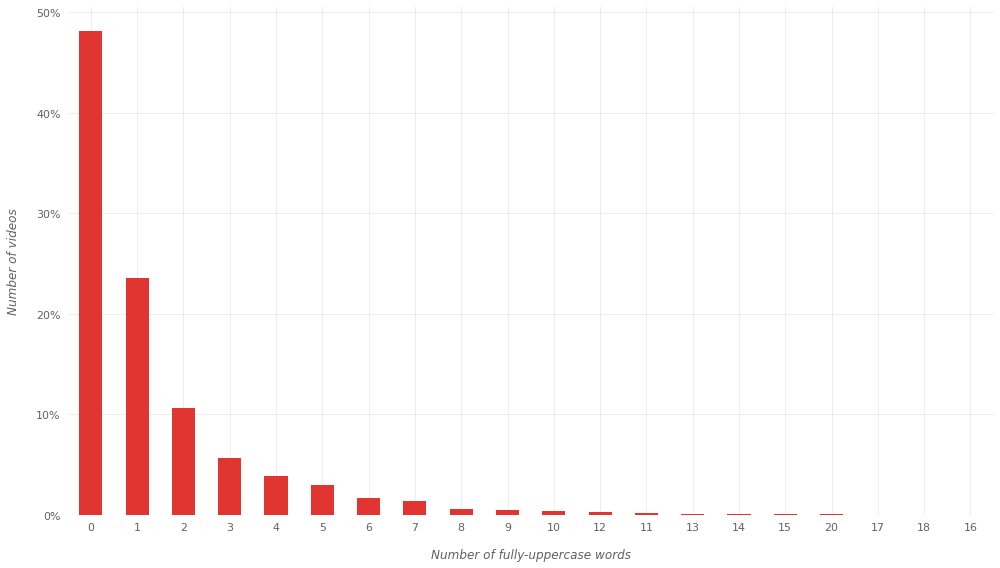

In [42]:
upper_counts = []
for t in df['title'].values:
    t = re.sub(r'[^\w]', ' ', t)
    t = t.split()
    c = 0
    for w in t:
        if w.isalpha() and w.isupper():
            c += 1
    upper_counts.append(c)


ax = (pd.Series(upper_counts).value_counts(normalize=True) * 100).plot(
    kind='bar', figsize=(14,8), rot=0, color=THEME_COL)
plot_conf(ax, xlbl='Number of fully-uppercase words', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}%'))
plt.tight_layout()
plt.savefig('yta2-uppwords.png', dpi=300)

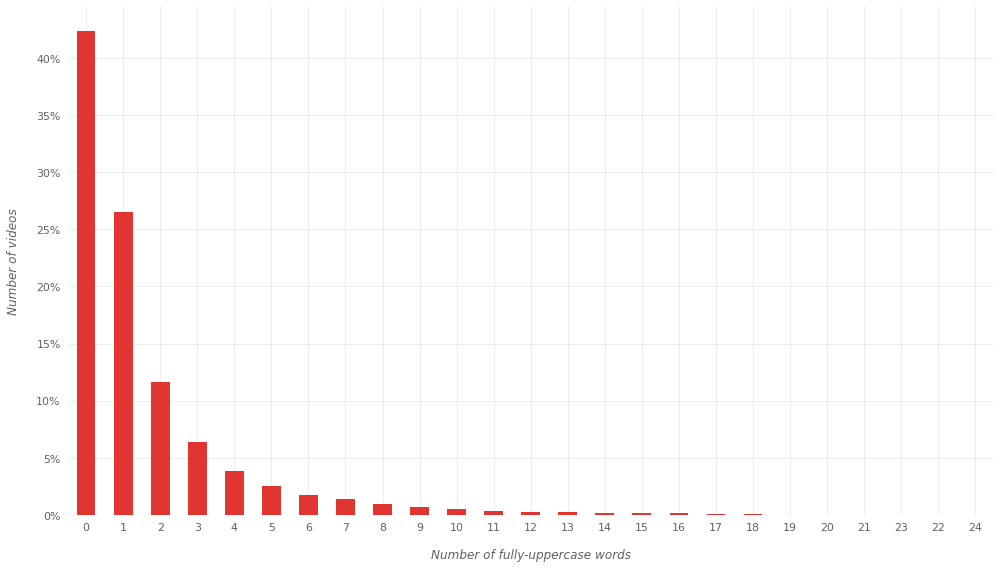

In [95]:
upper_counts = []
for t in df_nt['title'].values:
    t = re.sub(r'[^\w]', ' ', t)
    t = t.split()
    c = 0
    for w in t:
        if w.isalpha() and w.isupper():
            c += 1
    upper_counts.append(c)


ax = (pd.Series(upper_counts).value_counts(normalize=True) * 100).plot(
    kind='bar', figsize=(14,8), rot=0, color=THEME_COL)
plot_conf(ax, xlbl='Number of fully-uppercase words', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}%'))
plt.tight_layout()
plt.savefig('nt-uppwords.png', dpi=300)

Percentage of title-cased titles

In [43]:
titlecase_count = 0
for t in df['title'].values:
    t = re.sub(r'[^\w]', ' ', t)
    t = t.split()
    word_count = len(t) 
    c = 0
    for w in t:
        if w[0].isalpha() and w[0].isupper():
            c += 1
    if c >= 0.7 * word_count:
        titlecase_count += 1
print('{} titles out of {} titles are title-cased'.format(titlecase_count, df.shape[0]))

22164 titles out of 30000 titles are title-cased


Most common words in video titles

In [44]:
contractions = { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"I'd": "I had / I would",
"I'd've": "I would have",
"I'll": "I shall / I will",
"I'll've": "I shall have / I will have",
"I'm": "I am",
"I've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

nltk_download('stopwords')

# if a contraction has more than one possible expanded forms, we replace it 
# with a list of these possible forms
tmp = {}
for k,v in contractions.items():
    if "/" in v:
        tmp[k] = [x.strip() for x in v.split(sep="/")]
    else:
        tmp[k] = v
contractions = tmp

tokenizer = RegexpTokenizer(r"[\w']+")

all_titles = ' '.join([x.lower() for x in df['title']])
for k,v in contractions.items():
    if isinstance(v, list):
        v = random.choice(v)
    all_titles = all_titles.replace(k.lower(), v.lower())
    
words = list(tokenizer.tokenize(all_titles))
words_excl_stopwords = [x for x in words if x not in stopwords.words('english')]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [45]:
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ["#003f5c", "#2f4b7c", "#665191", "#a05195", "#d45087", "#f95d6a", "#ff7c43", "#ffa600"]
    return colors[len(word)%len(colors)]
WC_MAX_FZ = 400 
WC_RS = 0.5
wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, 
                         background_color="#fdf6e3", color_func=col_func, 
                         max_words=100,random_state=7, max_font_size=WC_MAX_FZ, 
                         relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter(words)))

fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)
plt.savefig('yta2-commwords.png', dpi=300)

ImportError: The _imagingft C module is not installed

In [46]:
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ["#14110c", "#214658", "#e7aa27", "#dc4e24"]
    return colors[len(word)%len(colors)]

wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, 
                         background_color="#e5e0cb", color_func=col_func, 
                         max_words=100,random_state=1, max_font_size=WC_MAX_FZ, 
                         relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter(words_excl_stopwords)))

fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)
plt.savefig('yta2-commwords-exc.png', dpi=300)

ImportError: The _imagingft C module is not installed

In [47]:
# a list with exact values
for w, c in Counter(words).most_common(35):
    print(w.ljust(10), c)

the        7032
official   4364
video      4298
to         3174
a          3132
2020       2434
i          2248
in         2221
of         1814
with       1768
my         1705
vs         1656
and        1622
music      1593
on         1474
is         1409
highlights 1322
ft         1200
2          1196
1          1118
trailer    1075
you        1030
for        1021
us         958
at         922
new        895
x          846
among      806
it         802
first      779
game       737
how        726
s          698
we         692
feat       646


Most common symbols in video titles

In [48]:
title_symbols = re.sub(r'\w', '', all_titles)
title_symbols = re.sub(r'\s', '', title_symbols)
title_symbols = list(title_symbols)
Counter(title_symbols).most_common(10)

[('-', 11010),
 ('|', 8234),
 (')', 7820),
 ('(', 7809),
 ('.', 7422),
 ('!', 5903),
 (',', 4755),
 ("'", 4116),
 (':', 3127),
 ('&', 2340)]

Distribution of title lengths

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


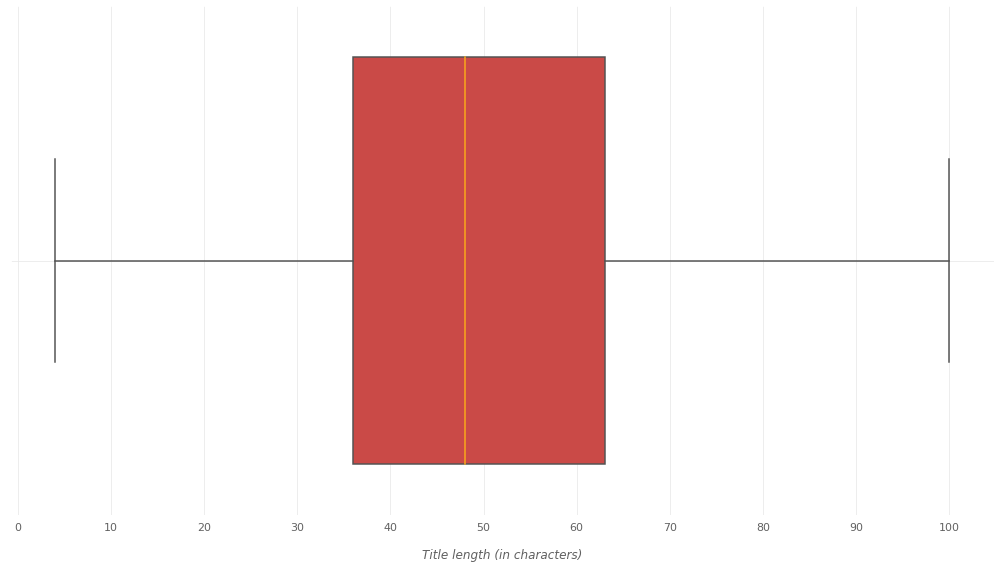

In [49]:
title_lengths = df["title"].apply(lambda x: len(x))
fig, ax = plt.subplots(figsize=(14,8))
sns.boxplot(title_lengths, color=THEME_COL, medianprops={'color': '#FBA91A'}, ax=ax)
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
plot_conf(ax, xlbl='Title length (in characters)', ticklbl_size=11, lbl_size=12)
plt.tight_layout()
plt.savefig('yta2-titdist.png', dpi=300)

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


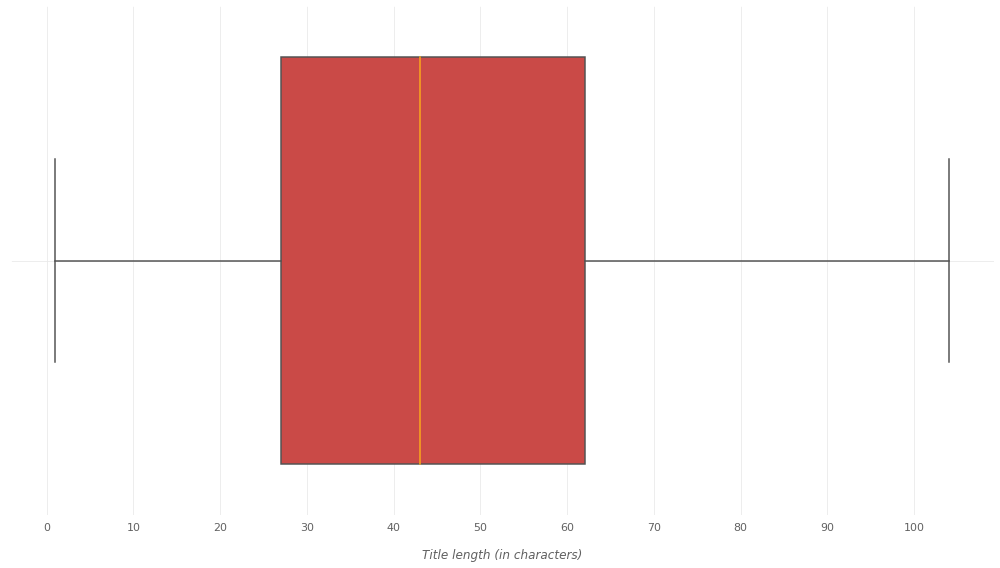

In [50]:
title_lengths = df_nt["title"].apply(lambda x: len(x))
fig, ax = plt.subplots(figsize=(14,8))
sns.boxplot(title_lengths, color=THEME_COL, medianprops={'color': '#FBA91A'}, ax=ax)
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
plot_conf(ax, xlbl='Title length (in characters)', ticklbl_size=11, lbl_size=12)
plt.tight_layout()
plt.savefig('nt-titdist.png', dpi=300)

In [51]:
title_lengths.describe()

count    60355.000000
mean        45.980118
std         24.795682
min          1.000000
25%         27.000000
50%         43.000000
75%         62.000000
max        104.000000
Name: title, dtype: float64

In [52]:
title_lengths.quantile(q=0.80)

68.0

In [53]:
title_lengths.quantile(q=0.90)

83.0

In [192]:
df[title_lengths == 4] 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,trending or not,publishing_day,publishing_hour,title_length,desc_length
515,vzXYz61U3Gk,We Need Some Time Apart,2020-08-10 23:23:49+00:00,UCZdQjaSoLjIzFnWsDQOv4ww,Sailing La Vagabonde,19,2020-08-14T00:00:00Z,[None],784869,40131,687,3290,https://i.ytimg.com/vi/vzXYz61U3Gk/default.jpg,False,False,[Episode 261] Life in close quarters can be fu...,1,Monday,23,23,2492
1013,YuCqyvBlcK8,$4 Pancake vs. $88 Pancake,2020-08-16 15:00:13+00:00,UCpko_-a4wgz2u_DgDgd9fqA,BuzzFeedVideo,22,2020-08-17T00:00:00Z,buzzfeed|buzzfeedvideo|buzzfeed video|Worth It...,733316,38203,426,2374,https://i.ytimg.com/vi/YuCqyvBlcK8/default.jpg,False,False,Worth It is back with Season 8! Six brand new ...,1,Sunday,15,26,1711
1815,2xPKE0koJtc,Democratic National Convention: Day 3,2020-08-20 03:34:51+00:00,UC8ZLJkQZMENy8CoS8zYczBA,2020 Democratic National Convention,25,2020-08-21T00:00:00Z,[None],767101,15300,6484,3519,https://i.ytimg.com/vi/2xPKE0koJtc/default.jpg,False,False,"Tune in on Wednesday, August 19 from 9-11 PM E...",1,Thursday,3,37,629
2590,LQLlMi6Wns8,Irish People Try Celebrity Alcohol,2020-08-17 20:00:02+00:00,UCabq3No3wXbs6Ut-Pux6SzA,The TRY Channel,24,2020-08-24T00:00:00Z,try channel|irish people try|facts channel|fac...,619490,28933,300,3476,https://i.ytimg.com/vi/LQLlMi6Wns8/default.jpg,False,False,"Ryan Reynolds' Aviation Gin, Matthew McConaugh...",1,Monday,20,34,1852
3484,jSklAwAnsxg,It’s kinda sketchy! Building & Riding the Teet...,2020-08-28 14:00:10+00:00,UCu8YylsPiu9XfaQC74Hr_Gw,Berm Peak,17,2020-08-29T00:00:00Z,mtb|mountain bike|bike repair|biking|bike ridi...,537417,41380,235,3421,https://i.ytimg.com/vi/jSklAwAnsxg/default.jpg,False,False,"The teeter totter was fun, but there's always ...",1,Friday,14,55,1268
4160,tuhxZytmhss,Yuridia - Él Lo Tiene Todo,2020-08-28 00:00:10+00:00,UC22QP-rNb5wWyJ0BQOWlXQA,YuridiaVEVO,10,2020-09-01T00:00:00Z,yuridia|el lo tiene todo yuridia|el lo tiene t...,1829350,103813,1293,11475,https://i.ytimg.com/vi/tuhxZytmhss/default.jpg,False,False,¡Escucha «Él Lo Tiene Todo» en tu plataforma f...,1,Friday,0,26,2413
6151,lIzYXcqASb8,Goku vs Naruto Rap Battle REMATCH! Part 2,2020-09-05 17:02:40+00:00,UC7LnJAhfmQBqKWIYQ7WBpkQ,SSJ9K,1,2020-09-11T00:00:00Z,ssj carter|ssjcarter|ssj9k|dbz|dragon ball|ani...,1250574,95295,1480,10036,https://i.ytimg.com/vi/lIzYXcqASb8/default.jpg,False,False,#GokuVsNarutoRapREMATCHGoku vs Naruto Rap Batt...,1,Saturday,17,42,737
6503,gSfq4Wbr264,DanPlan Animated | Can You Survive A Quiet Place?,2020-09-09 19:47:18+00:00,UC7UGbBVrqLlq6CRxWWUmyKw,DanPlan,1,2020-09-13T00:00:00Z,dan plan|by the way|danplan animation|a quiet ...,474933,50901,1619,6596,https://i.ytimg.com/vi/gSfq4Wbr264/default.jpg,False,False,"Daniel, Theo and Nelly try to survive A Quiet ...",1,Wednesday,19,49,825
7653,8woFfYUjd54,"2020 U.S. Open, Round 1: Every Tiger Woods Shot",2020-09-17 18:17:20+00:00,UCsZsn_S93Zs8JOdKMRbklmg,United States Golf Association (USGA),17,2020-09-19T00:00:00Z,[None],125794,559,29,144,https://i.ytimg.com/vi/8woFfYUjd54/default.jpg,False,False,Every shot of Tiger Woods' first round of the ...,1,Thursday,18,47,1198
8152,3Dg1CT31_uw,Rotimi - In My Bed (Official Video) (feat. Wale),2020-09-17 04:00:11+00:00,UCoRibcMag7XHejGkicZcAFg,Rotimi,10,2020-09-21T00:00:00Z,[None],830533,58178,333,2807,https://i.ytimg.com/vi/3Dg1CT31_uw/default.jpg,False,False,Listen to the album The Beauty of Becoming. Ou...,1,Thursday,4,48,201


In [52]:
df[title_lengths == 100].shape[0]

253

Channels with Most Trending Video

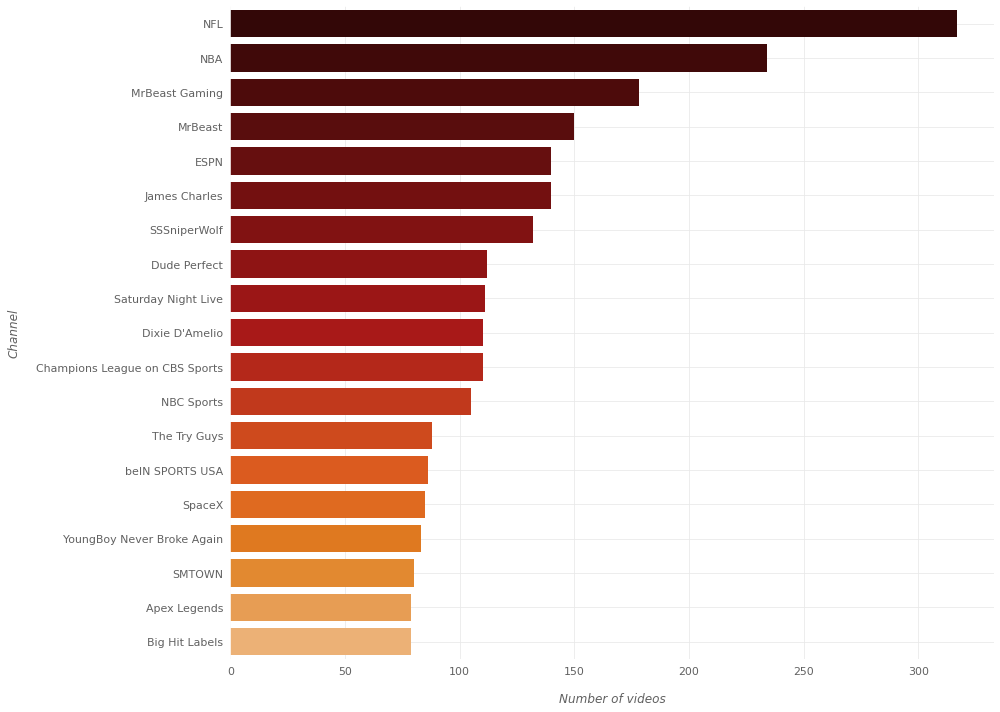

In [53]:
tdf = df.groupby("channelTitle").size().reset_index(name="video_count") \
    .sort_values("video_count", ascending=False).head(19)
fig, ax = plt.subplots(figsize=(14,10))
sns.barplot(x="video_count", y="channelTitle", data=tdf,
            palette=sns.color_palette('gist_heat', n_colors=25)[3:], ax=ax);
plot_conf(ax, xlbl='Number of videos', ylbl='Channel', ticklbl_size=11, lbl_size=12)
plt.tight_layout()
plt.savefig('yta2-topch.png', dpi=300)

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50713 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 48260 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 46356 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 50713 missing from current font.
  font.set_text(s, 0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 48260 missing from current font.
  font.set_text(s, 0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 46356 missing from current font.
  font.set_text

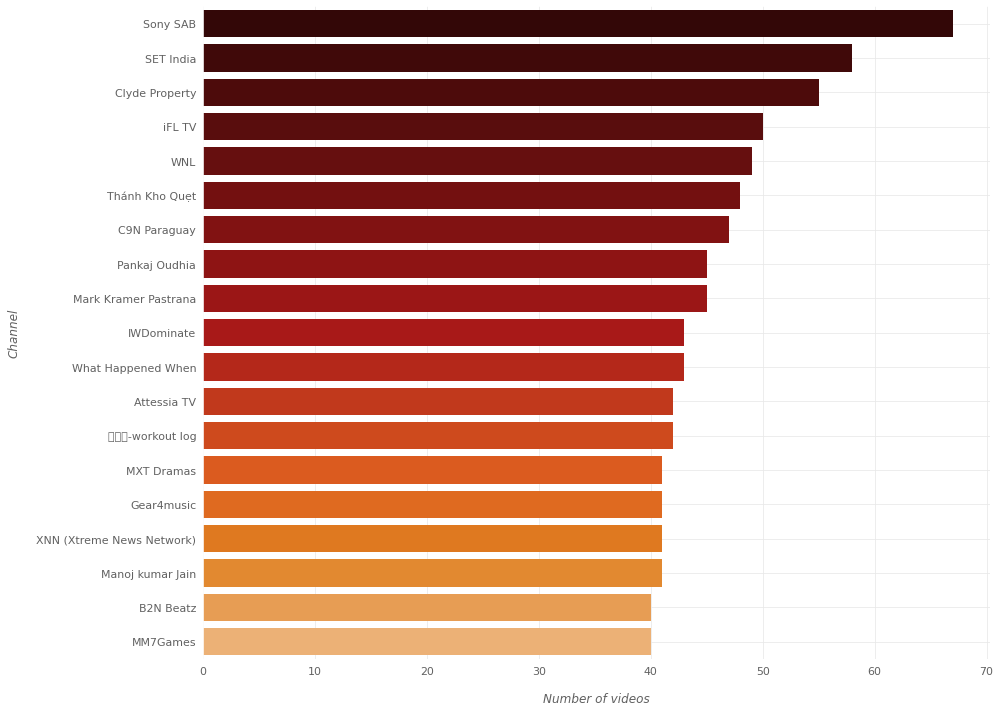

In [97]:
tdf = df_nt.groupby("channelTitle").size().reset_index(name="video_count") \
    .sort_values("video_count", ascending=False).head(19)
fig, ax = plt.subplots(figsize=(14,10))
sns.barplot(x="video_count", y="channelTitle", data=tdf,
            palette=sns.color_palette('gist_heat', n_colors=25)[3:], ax=ax);
plot_conf(ax, xlbl='Number of videos', ylbl='Channel', ticklbl_size=11, lbl_size=12)
plt.tight_layout()
plt.savefig('yta2-topch.png', dpi=300)

Top Categories of Trending Videos

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


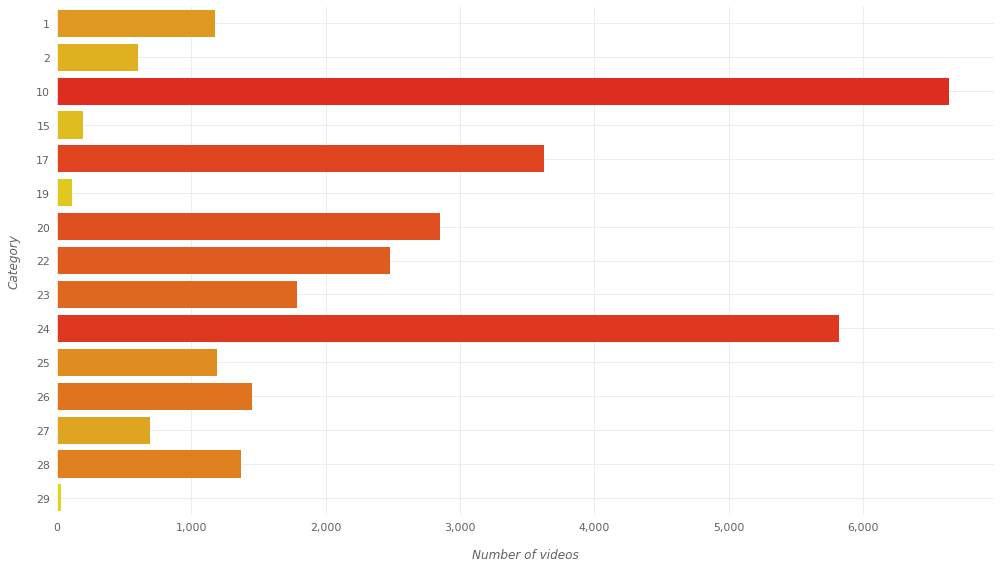

In [54]:
fig, ax = plt.subplots(figsize=(14,8))
tdf = df['categoryId'].value_counts(sort=True, ascending=False)
sns.barplot(tdf.values, tdf.index.values, hue=tdf.values, orient='h', 
            palette=reversed(sns.color_palette('autumn', n_colors=15)[:]), 
            dodge=False, ax=ax)
ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plot_conf(ax, xlbl='Number of videos', ylbl='Category', ticklbl_size=11, lbl_size=12)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig('yta2-topcat.png', dpi=300)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


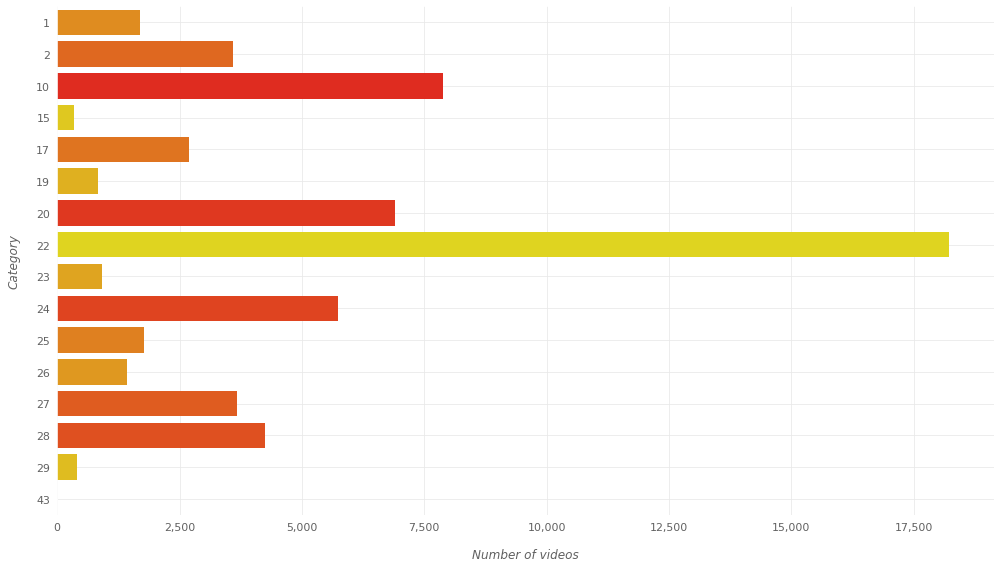

In [189]:
fig, ax = plt.subplots(figsize=(14,8))
tdf = df_nt['categoryId'].value_counts(sort=True, ascending=False)
sns.barplot(tdf.values, tdf.index.values, hue=tdf.values, orient='h', 
            palette=reversed(sns.color_palette('autumn', n_colors=15)[:]), 
            dodge=False, ax=ax)
ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plot_conf(ax, xlbl='Number of videos', ylbl='Category', ticklbl_size=11, lbl_size=12)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig('yta2-topcat.png', dpi=300)

#cleaning data

In [54]:
df[df["description"].apply(lambda x: pd.isna(x))].head(3)

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,trending or not
223,NSuaUok-wTY,[1147] Locksmith Says My Videos Are BS... Lose...,2020-08-12T13:00:12Z,UCm9K6rby98W8JigLoZOh6FQ,LockPickingLawyer,27,2020-08-13T00:00:00Z,Lock|picking,422963,62939,168,7304,https://i.ytimg.com/vi/NSuaUok-wTY/default.jpg,False,False,NaN,1
249,NYXABBpPJss,When you get on the grill for your friends Bir...,2020-08-12T04:36:57Z,UCI8hY4ummWDZgFSjxU_HFNQ,Jeremiah Phillips,23,2020-08-13T00:00:00Z,[None],193157,9057,148,666,https://i.ytimg.com/vi/NYXABBpPJss/default.jpg,False,False,NaN,1
446,NSuaUok-wTY,[1147] Locksmith Says My Videos Are BS... Lose...,2020-08-12T13:00:12Z,UCm9K6rby98W8JigLoZOh6FQ,LockPickingLawyer,27,2020-08-14T00:00:00Z,Lock|picking,511773,69610,214,7837,https://i.ytimg.com/vi/NSuaUok-wTY/default.jpg,False,False,NaN,1


In [55]:
df["description"] = df["description"].fillna(value="")

In [160]:
df.describe()

,categoryId,view_count,likes,dislikes,comment_count,trending or not
count,30000.000000,3.000000e+04,3.000000e+04,30000.000000,3.000000e+04,30000.0
mean,18.424433,2.733255e+06,1.575380e+05,3790.284067,1.743521e+04,1.0
std,7.235093,6.801097e+06,4.749869e+05,19376.938333,1.308544e+05,0.0
min,1.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,1.0
25%,10.000000,5.143498e+05,2.001675e+04,387.000000,1.961750e+03,1.0
50%,20.000000,1.081174e+06,5.116450e+04,924.500000,4.419500e+03,1.0
75%,24.000000,2.475925e+06,1.336850e+05,2639.000000,1.094200e+04,1.0
max,29.000000,2.326492e+08,1.573553e+07,879354.000000,6.065230e+06,1.0


In [56]:
#we treat time
tmp_publishedAt = df['publishedAt'].copy()
df['publishedAt'] = pd.to_datetime(df['publishedAt'])

tmp_publishedAt = df_nt['publishedAt'].copy()
df_nt['publishedAt'] = pd.to_datetime(df['publishedAt'])

In [57]:
df["publishing_day"] = df["publishedAt"].dt.day_name()
df["publishing_hour"] = df["publishedAt"].dt.hour

df_nt["publishing_day"] = df_nt["publishedAt"].dt.day_name()
df_nt["publishing_hour"] = df_nt["publishedAt"].dt.hour

In [58]:
df.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,trending or not,publishing_day,publishing_hour
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11 19:20:14+00:00,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,1,Tuesday,19
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11 17:00:10+00:00,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare...",1,Tuesday,17
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11 16:34:06+00:00,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...,1,Tuesday,16
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11 16:38:55+00:00,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...,1,Tuesday,16
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11 15:10:05+00:00,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...,1,Tuesday,15


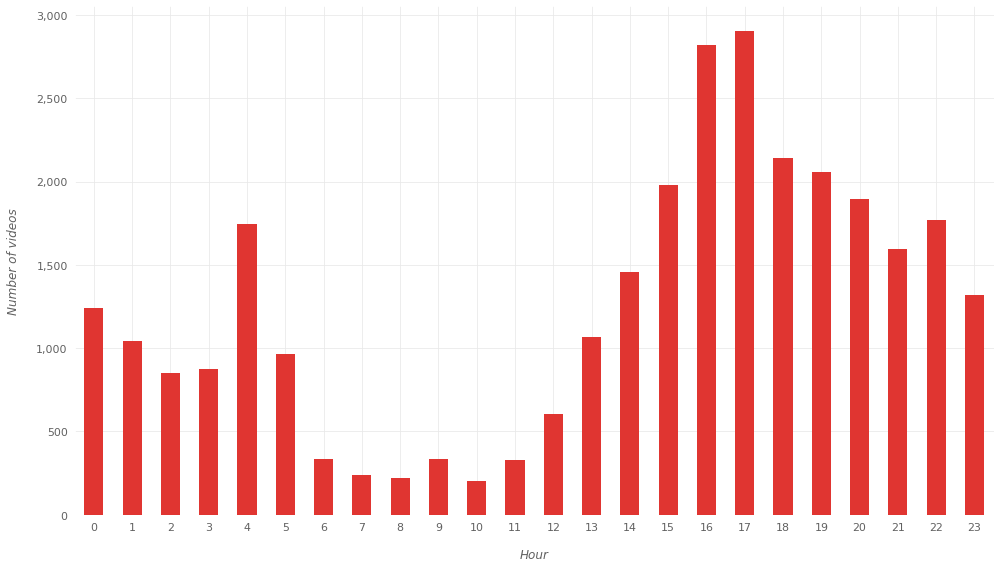

In [164]:
ax = df['publishing_hour'].value_counts().sort_index().plot(
    kind='bar', figsize=(14,8), rot=0, color=THEME_COL)

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plot_conf(ax, xlbl='Hour', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
# change_width(ax, .3)
plt.tight_layout()
plt.savefig('yta2-pophours.png', dpi=300)

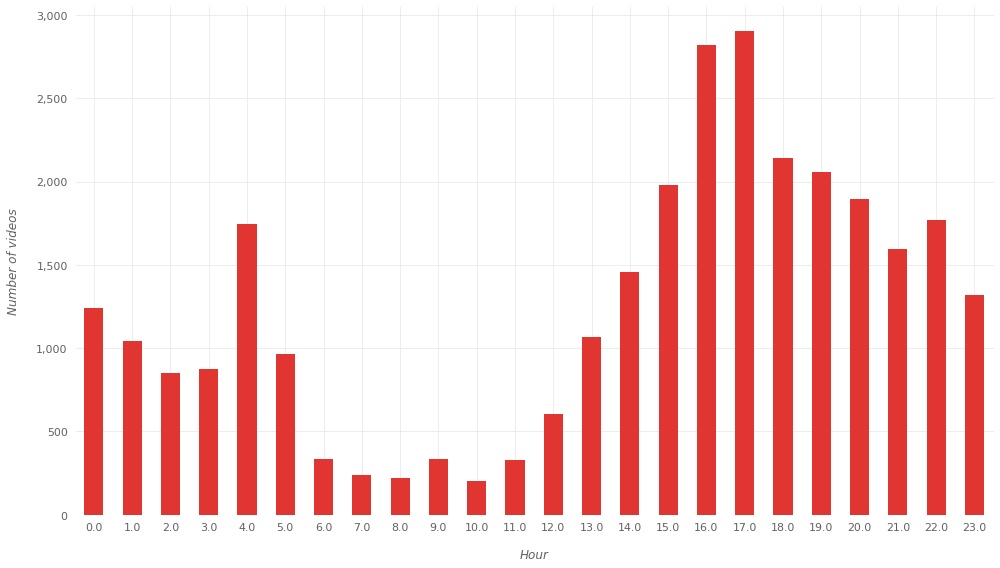

In [165]:
ax = df_nt['publishing_hour'].value_counts().sort_index().plot(
    kind='bar', figsize=(14,8), rot=0, color=THEME_COL)

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plot_conf(ax, xlbl='Hour', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
# change_width(ax, .3)
plt.tight_layout()
plt.savefig('yta2-pophours.png', dpi=300)

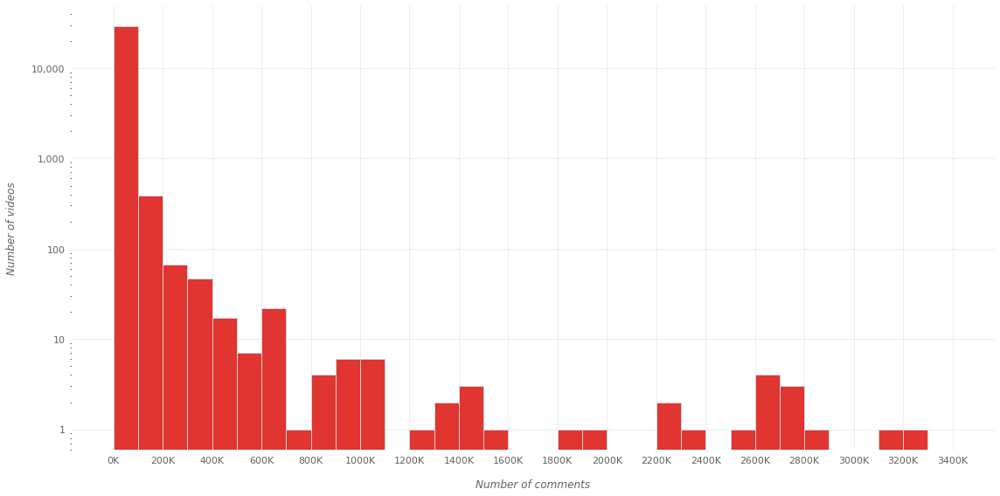

In [194]:
ax = df['comment_count'].plot(kind='hist', bins=np.arange(0, 3.5e6, 1e5)-0.5, figsize=(16,8), 
                           logy=True, lw=1, ec='lightgray', color=THEME_COL);
plot_conf(ax, xlbl='Number of comments', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
formatter = ticker.FuncFormatter(func=lambda x,y: '{:.0f}K'.format(x/1e3))
ax.xaxis.set_major_locator(ticker.MultipleLocator(200000))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(formatter));
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}'))
plt.tight_layout()
plt.savefig('ta2-comm-dist.png', dpi=300)

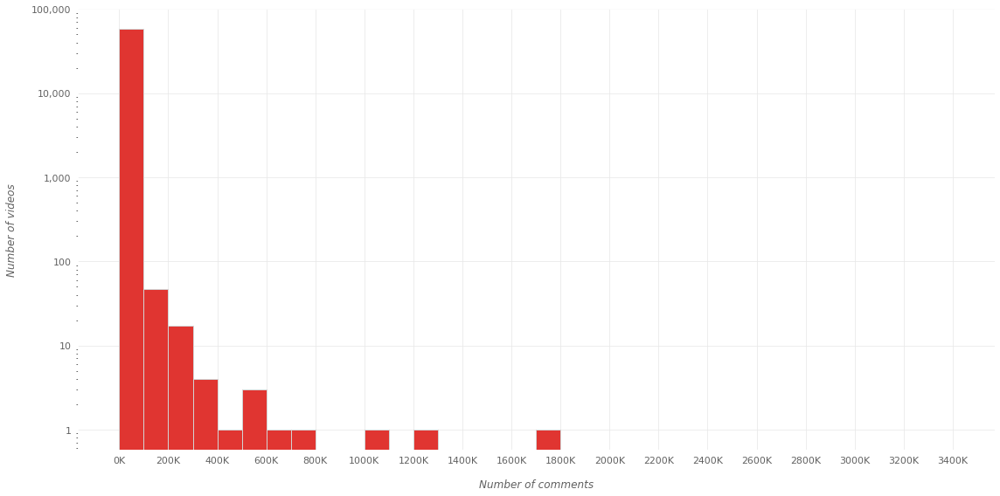

In [195]:
ax = df_nt['comment_count'].plot(kind='hist', bins=np.arange(0, 3.5e6, 1e5)-0.5, figsize=(16,8), 
                           logy=True, lw=1, ec='lightgray', color=THEME_COL);
plot_conf(ax, xlbl='Number of comments', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
formatter = ticker.FuncFormatter(func=lambda x,y: '{:.0f}K'.format(x/1e3))
ax.xaxis.set_major_locator(ticker.MultipleLocator(200000))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(formatter));
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}'))
plt.tight_layout()
plt.savefig('ta2-comm-dist.png', dpi=300)

#feature choosing

In [59]:
df['title_length'] = df['title'].str.len()
df['desc_length'] = df['description'].str.len()

df_nt['title_length'] = df['title'].str.len()
df_nt['desc_length'] = df['description'].str.len()

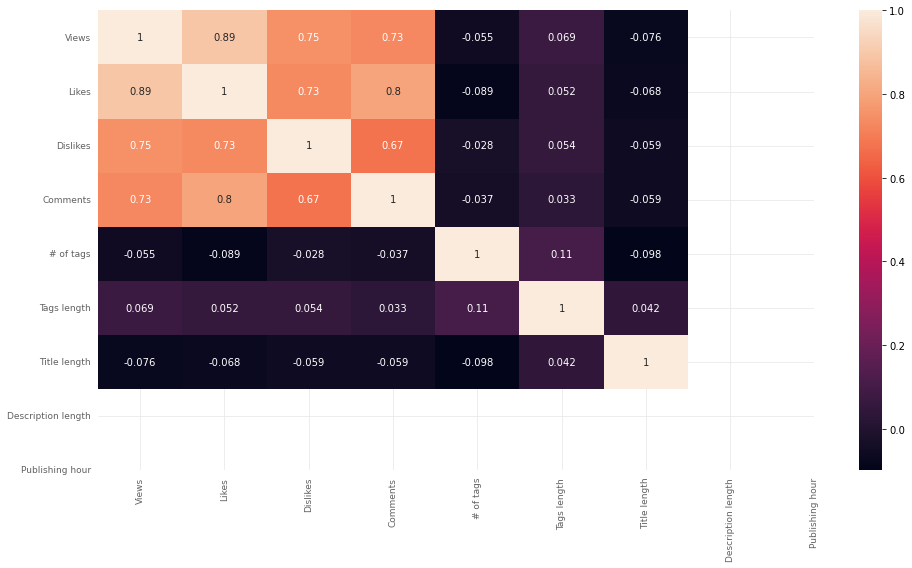

In [60]:
heatmap_columns = ['view_count', 'likes', 'dislikes', 'comment_count', 
                   'title_length', 'desc_length', 'publishing_hour']

h_labels = ['Views', 'Likes', 'Dislikes', 'Comments', '# of tags', 'Tags length', 
            'Title length', 'Description length', 'Publishing hour']

fig, ax = plt.subplots(figsize=(14,8))
sns.heatmap(df[heatmap_columns].corr(), annot=True, xticklabels=h_labels, yticklabels=h_labels)
plot_conf(ax)
plt.tight_layout()
plt.savefig('yta2-corr.png', dpi=300)

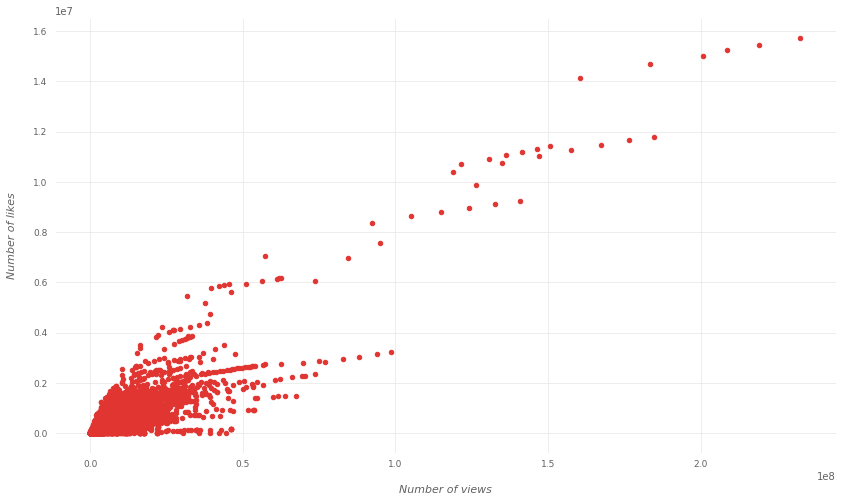

In [61]:
ax = df.plot(kind='scatter', x='view_count', y='likes', figsize=(14,8), color=THEME_COL)
plot_conf(ax, xlbl='Number of views', ylbl='Number of likes')

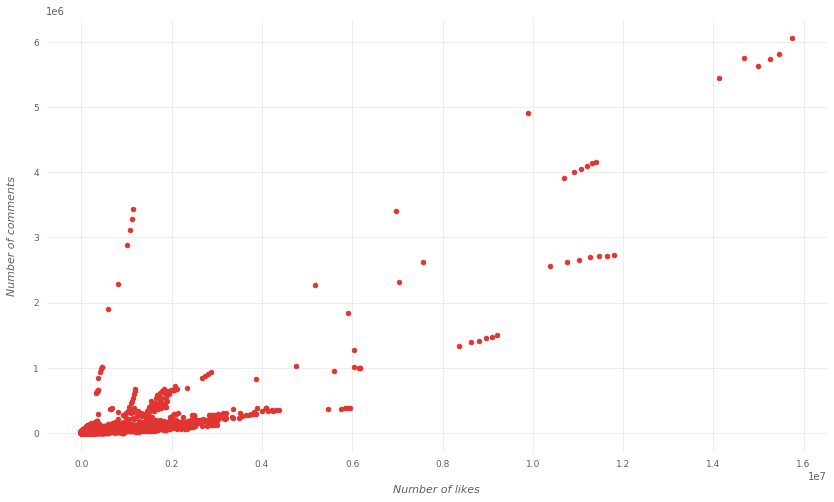

In [169]:
ax = df.plot(kind='scatter', x='likes', y='comment_count', figsize=(14,8), color=THEME_COL)
plot_conf(ax, xlbl='Number of likes', ylbl='Number of comments')

#now this is me building model

In [62]:
import pandas as pd
import numpy as np

from sklearn.preprocessing import scale
from sklearn.preprocessing import OneHotEncoder

from sklearn import linear_model, svm, datasets, metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score

from sklearn.decomposition import PCA, TruncatedSVD

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.datasets import load_digits

from dateutil.parser import parse
import datetime

In [63]:
df.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,...,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,trending or not,publishing_day,publishing_hour,title_length,desc_length
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11 19:20:14+00:00,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,...,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,1,Tuesday,19,34,361
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11 17:00:10+00:00,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,...,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare...",1,Tuesday,17,60,715
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11 16:34:06+00:00,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,...,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...,1,Tuesday,16,53,513
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11 16:38:55+00:00,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,...,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...,1,Tuesday,16,56,762
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11 15:10:05+00:00,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,...,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...,1,Tuesday,15,55,2493


In [64]:
df_nt.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,...,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,trending or not,publishing_day,publishing_hour,title_length,desc_length
0,zUt7jdOg0GI,6LB 162 - Faudrait,2020-08-11 19:20:14+00:00,UCnzz-NoUMm10rm2xaFywAXA,162 CLUB,22,NaN,NaN,1933.0,71.0,...,7.0,NaN,NaN,NaN,Réalisé par Mani vision : https://www.instagra...,0,Tuesday,19.0,34.0,361.0
1,bhL1h0xCOSU,▶️ War Thunder | Vought F8U-2 Crusader II,2020-08-11 17:00:10+00:00,UCqnCGVdgAjEqtko1lIjRUeQ,Die Freundliche MK-108,20,NaN,NaN,28.0,1.0,...,4.0,NaN,NaN,NaN,My first Ace in a Jet in RB. I kid you not. \n...,0,Tuesday,17.0,60.0,715.0
2,hsvtRmMfBxA,CYE Real Cybersecurity,2020-08-11 16:34:06+00:00,UCqcIuEorR6t_6prTnQ2Nv8w,CYE,28,NaN,NaN,432.0,3.0,...,0.0,NaN,NaN,NaN,We're defining what it means to provide real c...,0,Tuesday,16.0,53.0,513.0
3,i41NrsGFG1E,F8U-2 BUT IT'S BETTER : F-8E Crusader | War T...,2020-08-11 16:38:55+00:00,UCt2gEU9_iO8wetom5sf9ckQ,The Flying Tea Rex,20,NaN,NaN,4848.0,339.0,...,75.0,NaN,NaN,NaN,Today we're taking a look at the American F-8E...,0,Tuesday,16.0,56.0,762.0
4,FehkvRNMvF8,WFN Health Team Greeting,2020-08-11 15:10:05+00:00,UCIsgoTwD2Y3W5Gvlb2_bD5Q,Westbank First Nation,22,NaN,NaN,518.0,13.0,...,0.0,NaN,NaN,NaN,NaN,0,Tuesday,15.0,55.0,2493.0


In [34]:
#my old friend encoder

In [85]:
#select only required columns
# columns_to_pick = ['title_length', 'categoryId','view_count', 'comment_count',
#                     'likes', 'desc_length', 'trending or not']
# df_processed = df[columns_to_pick]
# df_nt_processed = df_nt[columns_to_pick]

# #drop NA
# df_processed = df_processed.dropna()
# df_nt_processed = df_nt_processed.dropna()

df_for_classification_concat = pd.concat([df_processed, df_nt_processed])
df_labels = df_for_classification_concat['trending or not']
df_for_classification = df_for_classification_concat.drop(['trending or not'], axis=1)

In [80]:
df_for_classification.head()

,title_length,categoryId,view_count,comment_count,likes,desc_length
0,34.0,22,1514614.0,35313.0,156908.0,361.0
1,60.0,20,2381688.0,16549.0,146739.0,715.0
2,53.0,24,2038853.0,40221.0,353787.0,513.0
3,56.0,10,496771.0,7647.0,23251.0,762.0
4,55.0,26,1123889.0,2196.0,45802.0,2493.0


In [81]:
#split test and train
from sklearn.model_selection import train_test_split
x_train_, x_test_, y_train_, y_test_ = train_test_split(df_for_classification, df_labels,test_size =0.3)

In [74]:
#Evaluating the model result
from sklearn.decomposition import PCA, TruncatedSVD
#Dimensionality reduction

def create_importance_dataframe(pca, original_num_df):
    # Change pcs components ndarray to a dataframe
    importance_df  = pd.DataFrame(pca.components_)
    # Assign columns
    importance_df.columns  = original_num_df.columns
    # Change to absolute values
    importance_df =importance_df.apply(np.abs)
    # Transpose
    importance_df=importance_df.transpose()
   # Change column names again
    ## First get number of pcs
    num_pcs = importance_df.shape[1]
    ## Generate the new column names
    new_columns = [f'PC{i}' for i in range(1, num_pcs + 1)]
    ## Now rename
    importance_df.columns  =new_columns
    # Return importance df
    return importance_df

n_components = 10 #the new number of features

#PCA
pca = PCA(whiten = 'True')
x_pca = pca.fit(x_train_).transform(x_train_)
y_pca = pca.transform(x_test_)

#print(pca.explained_variance_)
importance_df  = create_importance_dataframe(pca, x_test_)
display(importance_df.head())
pc1_top_10_features = importance_df['PC1'].sort_values(ascending = False)
print(), print(f'PC1 top 10 feautres are \n')
display(pc1_top_10_features )
#use variables x_pca and train_y for training and y_pca for prediction

,PC1,PC2,PC3,PC4,PC5,PC6
title_length,1.592239e-08,0.000003,0.000014,2.399417e-03,9.999775e-01,6.262049e-03
categoryId,1.860775e-08,0.000002,0.000003,6.718443e-05,6.262228e-03,9.999804e-01
view_count,9.999599e-01,0.008914,0.000912,3.709948e-07,2.881307e-08,1.672530e-09
comment_count,1.142995e-03,0.227869,0.973691,9.269896e-05,1.322080e-05,3.033863e-06
likes,8.887680e-03,0.973651,0.227870,1.130862e-04,6.862962e-06,2.311710e-06



PC1 top 10 feautres are 



view_count       9.999599e-01
likes            8.887680e-03
comment_count    1.142995e-03
desc_length      5.281805e-07
categoryId       1.860775e-08
title_length     1.592239e-08
Name: PC1, dtype: float64

In [76]:
x_pca

array([[-0.10967652, -0.20038891,  0.14600374,  0.46402697, -1.05527807,
        -1.25989413],
       [-0.10330405, -0.20149605,  0.14598649, -0.13034752,  0.9441521 ,
        -1.21990103],
       [-0.1096806 , -0.20039816,  0.14601625,  1.38310614, -1.25703947,
        -0.03202192],
       ...,
       [ 0.08790098,  1.01781525, -1.36410149,  1.05089817,  1.14652997,
         0.8390822 ],
       [-0.09692856, -0.1660069 ,  0.11910574, -0.59691016, -0.79204152,
         0.54729922],
       [ 0.93577477,  2.57401304, -2.39216776,  0.08848434, -0.63743853,
         0.99689298]])

In [88]:
import plotly.express as px
from sklearn.decomposition import PCA

# df = px.data.iris()
# features = ["sepal_width", "sepal_length", "petal_width", "petal_length"]

pca = PCA()
columns = ['title_length', 'categoryId','view_count', 'comment_count',
                    'likes', 'desc_length']
components = pca.fit_transform(df_for_classification_concat[columns])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=df_for_classification_concat["trending or not"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [73]:
!pip install plotly

In [91]:
#GradientBoostingClassifier model
clf = GradientBoostingClassifier(n_estimators=100)
clf.fit(x_train_, y_train_)
y_pred = clf.predict(x_test_)
print('Gradient Boosting Classifier score:', accuracy_score(y_test_, y_pred))
fpr, tpr, thresholds = metrics.roc_curve(y_test_, y_pred, pos_label=2)
print("Area Under the Curve (AUC)" ,metrics.auc(fpr, tpr))
print("F1 Score: ",f1_score(y_test_, y_pred, average="micro"))
print(clf.score(x_train_, y_train_))

Gradient Boosting Classifier score: 0.957609689213894
Area Under the Curve (AUC) nan
F1 Score:  0.957609689213894
0.9594779883453308


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:949: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



In [92]:
print(clf.score(x_test_, y_test_))

0.957609689213894


In [93]:
#Random Forest Classifier model 

n_estimators = 20 #number of trees we want to use, can be iterated afterwards

#Training the model
rf = RandomForestClassifier() #can pass the input n_estimators = n_estimators
rf.fit(x_train_,y_train_) #input x_train should consider the output from one of the previous methodology reductions
y_pred = rf.predict(x_test_).astype(int)

print('Random Forest Classifier score:', accuracy_score(y_test_, y_pred))
fpr, tpr, thresholds = metrics.roc_curve(y_test_, y_pred, pos_label=2)
print("Area Under the Curve (AUC)" ,metrics.auc(fpr, tpr))
print("F1 Score: ",f1_score(y_test_, y_pred, average="micro"))
print(rf.score(x_train_, y_train_))
print(rf.score(x_test_, y_test_))

Random Forest Classifier score: 0.9711494515539305
Area Under the Curve (AUC) nan
F1 Score:  0.9711494515539305


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:949: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



1.0
0.9711494515539305


In [94]:
#KNN model #score 

## Train a simple KNN classifier using featurized data
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(x_train_,y_train_)
y_pred = neigh.predict(x_test_).astype(int)

print('KNN score:', accuracy_score(y_test_, y_pred))
fpr, tpr, thresholds = metrics.roc_curve(y_test_, y_pred, pos_label=2)
print("Area Under the Curve (AUC)" ,metrics.auc(fpr, tpr))
print("F1 Score: ",f1_score(y_test_, y_pred, average="micro"))

print(neigh.score(x_train_, y_train_))
print(neigh.score(x_test_, y_test_))

KNN score: 0.9271595063985375
Area Under the Curve (AUC) nan
F1 Score:  0.9271595063985375


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:949: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



0.9570540130258067
0.9271595063985375


In [95]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

clf_pruned = DecisionTreeClassifier(criterion = "gini", random_state = 0, max_depth=15, min_samples_leaf=3)
clf_pruned.fit(x_train_, y_train_)

print(clf_pruned.classes_)
print(clf_pruned.decision_path)
print(clf_pruned.feature_importances_)

y_pred = clf_pruned.predict(x_test_)
print(y_pred)

print('Decision Tree score:', accuracy_score(y_test_, y_pred))
fpr, tpr, thresholds = metrics.roc_curve(y_test_, y_pred, pos_label=2)
print("Area Under the Curve (AUC)" ,metrics.auc(fpr, tpr))
print("F1 Score: ",f1_score(y_test_, y_pred, average="micro"))

print(clf_pruned.score(x_train_, y_train_))
print(clf_pruned.score(x_test_, y_test_))

[0 1]
<bound method BaseDecisionTree.decision_path of DecisionTreeClassifier(max_depth=15, min_samples_leaf=3, random_state=0)>
[0.01530015 0.01883283 0.0695158  0.85822937 0.02313347 0.01498838]
[1 0 0 ... 1 0 0]
Decision Tree score: 0.9595521023765996
Area Under the Curve (AUC) nan
F1 Score:  0.9595521023765996
0.9827873267714607
0.9595521023765996


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:949: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



#XGbooster

In [96]:
from sklearn.feature_selection import SelectFromModel
from numpy import loadtxt
from numpy import sort
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
import xgboost as xgb
model = XGBClassifier(max_depth= 15, objective = 'multi:softmax',gamma= 5 ,num_class = 10, reg_lambda= 0.8,colsample_bytree= 0.8)
model.fit(x_train_, y_train_)
y_pred = model.predict(x_test_)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(y_test_,predictions)
print("  Accuracy: %.2f%%" % ( accuracy*100.0)) 
print(model.score(x_test_, y_test_))

C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:24:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softmax' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
  Accuracy: 96.60%
0.9660077696526508


#catbooster

In [208]:
!pip install catboost
from catboost import CatBoostClassifier
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV

In [209]:
from catboost import CatBoostClassifier
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV


model =  CatBoostClassifier(
    iterations=6000,
    random_strength=1, #reduce overfitting
    depth=6, #depth of the tree
    l2_leaf_reg=2,
    border_count=64,
    rsm = 0.2,
    score_function= 'L2',
    loss_function='MultiClass',
    eval_metric='Accuracy',
    boosting_type = 'Plain',
    # silent = True
)
# Fit model
model.fit(x_train_, y_train_)
# Get predictions
preds = model.predict(x_test_)

from sklearn.metrics import f1_score

fpr, tpr, thresholds = metrics.roc_curve(y_test_, model.predict(x_test_).astype(int), pos_label=2)
print("Area Under the Curve (AUC): " ,metrics.auc(fpr, tpr))
print('accuracy score:', accuracy_score(y_test_, model.predict(x_test_).astype(int)))
print("F1 Score: ",f1_score(y_test_, model.predict(x_test_).astype(int), average="micro"))

Streaming output truncated to the last 5000 lines.
1000:	learn: 0.9593066	total: 32.3s	remaining: 2m 41s
1001:	learn: 0.9593066	total: 32.3s	remaining: 2m 41s
1002:	learn: 0.9593556	total: 32.3s	remaining: 2m 41s
1003:	learn: 0.9593556	total: 32.4s	remaining: 2m 41s
1004:	learn: 0.9593556	total: 32.4s	remaining: 2m 40s
1005:	learn: 0.9593556	total: 32.4s	remaining: 2m 40s
1006:	learn: 0.9593556	total: 32.4s	remaining: 2m 40s
1007:	learn: 0.9593556	total: 32.4s	remaining: 2m 40s
1008:	learn: 0.9593556	total: 32.5s	remaining: 2m 40s
1009:	learn: 0.9593556	total: 32.5s	remaining: 2m 40s
1010:	learn: 0.9593556	total: 32.5s	remaining: 2m 40s
1011:	learn: 0.9593311	total: 32.5s	remaining: 2m 40s
1012:	learn: 0.9594290	total: 32.5s	remaining: 2m 40s
1013:	learn: 0.9594045	total: 32.6s	remaining: 2m 40s
1014:	learn: 0.9595270	total: 32.6s	remaining: 2m 40s
1015:	learn: 0.9595270	total: 32.7s	remaining: 2m 40s
1016:	learn: 0.9594535	total: 32.7s	remaining: 2m 40s
1017:	learn: 0.9594290	total: 3

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


Area Under the Curve (AUC):  nan
accuracy score: 0.9682929616087751
F1 Score:  0.9682929616087751


#hyper parameter tuning

In [210]:
!pip install hyperopt
from sklearn.metrics import accuracy_score
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

In [211]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

In [212]:
def objective(space):
    clf=xgb.XGBClassifier(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( x_train_, y_train_), ( x_test_, y_test_)]
    
    clf.fit(x_train_, y_train_,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)
    pred = clf.predict(x_test_)
    accuracy = accuracy_score(y_test_, pred>0.5)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [213]:
import xgboost as xgb
trials = Trials()

best_hyperparams = fmin(fn = objective,space = space, algo = tpe.suggest, max_evals = 100,trials = trials)

print("The best hyperparameters are : ","\n")
print(best_hyperparams)

SCORE:
0.9374428702010968
SCORE:
0.9363002742230347
SCORE:
0.9358432358318098
SCORE:
0.9358432358318098
SCORE:
0.9375571297989032
SCORE:
0.9375571297989032
SCORE:
0.9363574040219378
SCORE:
0.9368715722120659
SCORE:
0.9375571297989032
SCORE:
0.9358432358318098
SCORE:
0.9375571297989032
SCORE:
0.9375571297989032
SCORE:
0.9358432358318098
SCORE:
0.9375571297989032
SCORE:
0.9358432358318098
SCORE:
0.9358432358318098
SCORE:
0.9358432358318098
SCORE:
0.9375571297989032
SCORE:
0.9375571297989032
SCORE:
0.9358432358318098
SCORE:
0.9371572212065814
SCORE:
0.9358432358318098
SCORE:
0.9371572212065814
SCORE:
0.9377856489945156
SCORE:
0.9375571297989032
SCORE:
0.9377285191956124
SCORE:
0.9377285191956124
SCORE:
0.9373286106032906
SCORE:
0.9377856489945156
SCORE:
0.9376142595978062
SCORE:
0.9364145338208409
SCORE:
0.9365859232175503
SCORE:
0.9374428702010968
SCORE:
0.9372143510054844
SCORE:
0.9376142595978062
SCORE:
0.9375571297989032
SCORE:
0.9364716636197441
SCORE:
0.9375571297989032
SCORE:
0.937

#this is our time to use the best hyper parameter to use the XGbooster


In [97]:
from sklearn.feature_selection import SelectFromModel
from numpy import loadtxt
from numpy import sort
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
import xgboost as xgb
model = XGBClassifier(max_depth= 12, objective = 'multi:softmax',gamma= 6.78 ,num_class = 10, reg_lambda= 0.46,colsample_bytree= 0.84)
model.fit(x_train_, y_train_)
y_pred = model.predict(x_test_)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(y_test_,predictions)
print("  Accuracy: %.2f%%" % ( accuracy*100.0)) 
print(model.score(x_test_, y_test_))

C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:25:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softmax' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
  Accuracy: 96.44%
0.9644081352833638


#catbooster hyperparameter tuning

In [215]:
#import libraries
from sklearn import datasets
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV
# load data
cancer = datasets.load_breast_cancer()

# target
y = y_train_

# features
X = x_train_

#Instantiate CatBoostClassifier
cbc = CatBoostClassifier()

#create the grid
grid = {'max_depth': [3,4,5],'n_estimators':[100, 200, 300]}

#Instantiate GridSearchCV
gscv = GridSearchCV (estimator = cbc, param_grid = grid, scoring ='accuracy', cv = 5)

#fit the model
gscv.fit(X,y)

#returns the estimator with the best performance
print(gscv.best_estimator_)

#returns the best score
print(gscv.best_score_)

#returns the best parameters
print(gscv.best_params_)

Streaming output truncated to the last 5000 lines.
125:	learn: 0.0976763	total: 962ms	remaining: 565ms
126:	learn: 0.0975943	total: 968ms	remaining: 557ms
127:	learn: 0.0975295	total: 975ms	remaining: 548ms
128:	learn: 0.0973448	total: 982ms	remaining: 540ms
129:	learn: 0.0972070	total: 989ms	remaining: 532ms
130:	learn: 0.0970096	total: 995ms	remaining: 524ms
131:	learn: 0.0969353	total: 1s	remaining: 517ms
132:	learn: 0.0968382	total: 1.01s	remaining: 512ms
133:	learn: 0.0967309	total: 1.03s	remaining: 505ms
134:	learn: 0.0965330	total: 1.03s	remaining: 498ms
135:	learn: 0.0964964	total: 1.04s	remaining: 489ms
136:	learn: 0.0964403	total: 1.05s	remaining: 481ms
137:	learn: 0.0963354	total: 1.05s	remaining: 473ms
138:	learn: 0.0962191	total: 1.06s	remaining: 465ms
139:	learn: 0.0961204	total: 1.07s	remaining: 457ms
140:	learn: 0.0959934	total: 1.07s	remaining: 449ms
141:	learn: 0.0958910	total: 1.08s	remaining: 441ms
142:	learn: 0.0957665	total: 1.09s	remaining: 434ms
143:	learn: 0.09

In [98]:
from catboost import CatBoostClassifier
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV


model =  CatBoostClassifier(
    iterations=200,
    random_strength=1, #reduce overfitting
    depth=5, #depth of the tree
    l2_leaf_reg=2,
    border_count=64,
    rsm = 0.2,
    score_function= 'L2',
    loss_function='MultiClass',
    eval_metric='Accuracy',
    boosting_type = 'Plain',
    # silent = True
)
# Fit model
model.fit(x_train_, y_train_)
# Get predictions
preds = model.predict(x_test_)

from sklearn.metrics import f1_score

fpr, tpr, thresholds = metrics.roc_curve(y_test_, model.predict(x_test_).astype(int), pos_label=2)
print("Area Under the Curve (AUC): " ,metrics.auc(fpr, tpr))
print('accuracy score:', accuracy_score(y_test_, model.predict(x_test_).astype(int)))
print("F1 Score: ",f1_score(y_test_, model.predict(x_test_).astype(int), average="micro"))
print(model.score(x_test_, y_test_))

0:	learn: 0.9363156	total: 193ms	remaining: 38.4s
1:	learn: 0.9363156	total: 200ms	remaining: 19.8s
2:	learn: 0.9363156	total: 212ms	remaining: 13.9s
3:	learn: 0.9366583	total: 227ms	remaining: 11.1s
4:	learn: 0.9366583	total: 236ms	remaining: 9.2s
5:	learn: 0.9363156	total: 251ms	remaining: 8.11s
6:	learn: 0.9363156	total: 271ms	remaining: 7.47s
7:	learn: 0.9363156	total: 302ms	remaining: 7.24s
8:	learn: 0.9363156	total: 336ms	remaining: 7.12s
9:	learn: 0.9363156	total: 353ms	remaining: 6.71s
10:	learn: 0.9363156	total: 382ms	remaining: 6.57s
11:	learn: 0.9363156	total: 428ms	remaining: 6.7s
12:	learn: 0.9367563	total: 461ms	remaining: 6.63s
13:	learn: 0.9367563	total: 485ms	remaining: 6.44s
14:	learn: 0.9381274	total: 521ms	remaining: 6.43s
15:	learn: 0.9397924	total: 555ms	remaining: 6.38s
16:	learn: 0.9398658	total: 587ms	remaining: 6.32s
17:	learn: 0.9398658	total: 595ms	remaining: 6.01s
18:	learn: 0.9399148	total: 626ms	remaining: 5.96s
19:	learn: 0.9385926	total: 653ms	remaining

170:	learn: 0.9446403	total: 3.2s	remaining: 543ms
171:	learn: 0.9446403	total: 3.21s	remaining: 523ms
172:	learn: 0.9446403	total: 3.22s	remaining: 503ms
173:	learn: 0.9446648	total: 3.23s	remaining: 483ms
174:	learn: 0.9447383	total: 3.25s	remaining: 464ms
175:	learn: 0.9447383	total: 3.27s	remaining: 446ms
176:	learn: 0.9447383	total: 3.29s	remaining: 427ms
177:	learn: 0.9446648	total: 3.3s	remaining: 408ms
178:	learn: 0.9446648	total: 3.3s	remaining: 388ms
179:	learn: 0.9447383	total: 3.32s	remaining: 369ms
180:	learn: 0.9447383	total: 3.32s	remaining: 349ms
181:	learn: 0.9447383	total: 3.33s	remaining: 329ms
182:	learn: 0.9447383	total: 3.34s	remaining: 311ms
183:	learn: 0.9447383	total: 3.36s	remaining: 292ms
184:	learn: 0.9447383	total: 3.36s	remaining: 273ms
185:	learn: 0.9447383	total: 3.37s	remaining: 254ms
186:	learn: 0.9447383	total: 3.38s	remaining: 235ms
187:	learn: 0.9448117	total: 3.4s	remaining: 217ms
188:	learn: 0.9445424	total: 3.4s	remaining: 198ms
189:	learn: 0.944

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:949: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless

